# **Lab 5.2 Denoise & Deblur image with Autoencoder**

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.
The gaussian blur kernel size parameter should be random in the range [3,11]
and gaussian noise mean should be randoom in range [-50,50].

Parameters:
- image_paths: A list of paths to the images to be loaded.
- gauss_noise: A boolean flag to indicate if Gaussian noise should be added to the image.
- gauss_blur: A boolean flag to indicate if Gaussian blur should be applied to the image.
- resize: The size to which the image should be resized.
- p: Probability of applying certain transformations (like Gaussian noise or blur).

In [ ]:
### START CODE HERE ###
class CustomImageDataset(Dataset):
    def __init__(self, image_paths, gauss_noise=False, gauss_blur=False, resize=128, p=0.5):
        self.p = p
        self.resize = resize
        self.gauss_noise = gauss_noise
        self.gauss_blur = gauss_blur
        self.image_paths = image_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (self.resize, self.resize))
        gt_image = image.copy().astype(np.float32) / 255.0
        image = image.astype(np.float32) / 255.0
        
        if self.gauss_blur and random.random() < self.p:
            kernel_size = random.choice(range(3, 12, 2))  # Random odd kernel size [3,5,7,9,11]
            image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
        
        if self.gauss_noise and random.random() < self.p:
            noise_mean = random.uniform(-50, 50) / 255.0  # Convert to [0,1] range
            noise = np.random.normal(noise_mean, 0.1, image.shape)
            image = np.clip(image + noise, 0, 1)
        
        image = torch.from_numpy(image.transpose(2, 0, 1)).float()
        gt_image = torch.from_numpy(gt_image.transpose(2, 0, 1)).float()

        return image, gt_image
    
### END CODE HERE ###

Use your [`CustomImageDataset()`](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#:~:text=transformed_dataset%20%3D%20FaceLandmarksDataset,3%3A%0A%20%20%20%20%20%20%20%20break)  to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Noisy blury images (this reference use salt and pepper noise)<br>
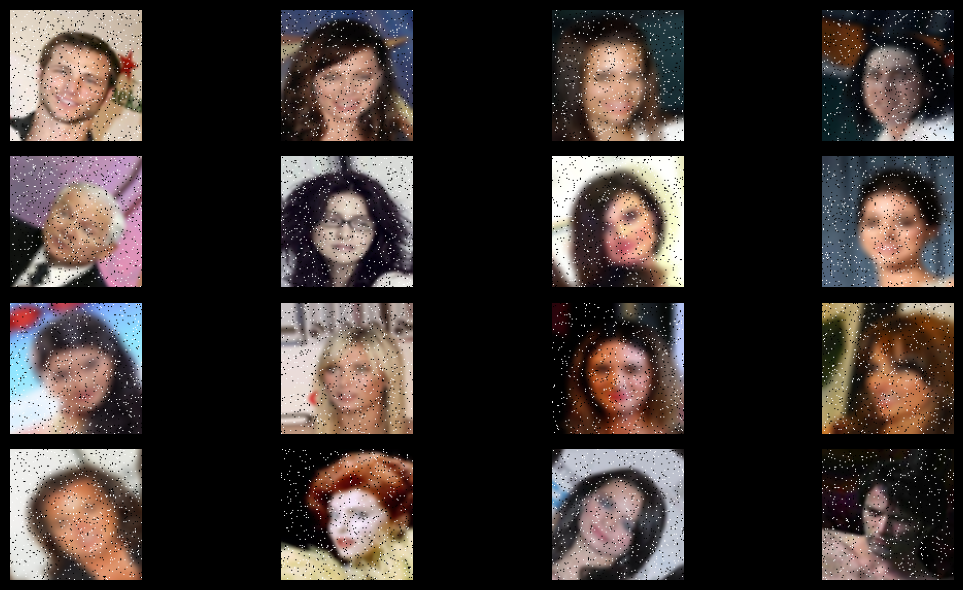

- Ground Truth images<br>
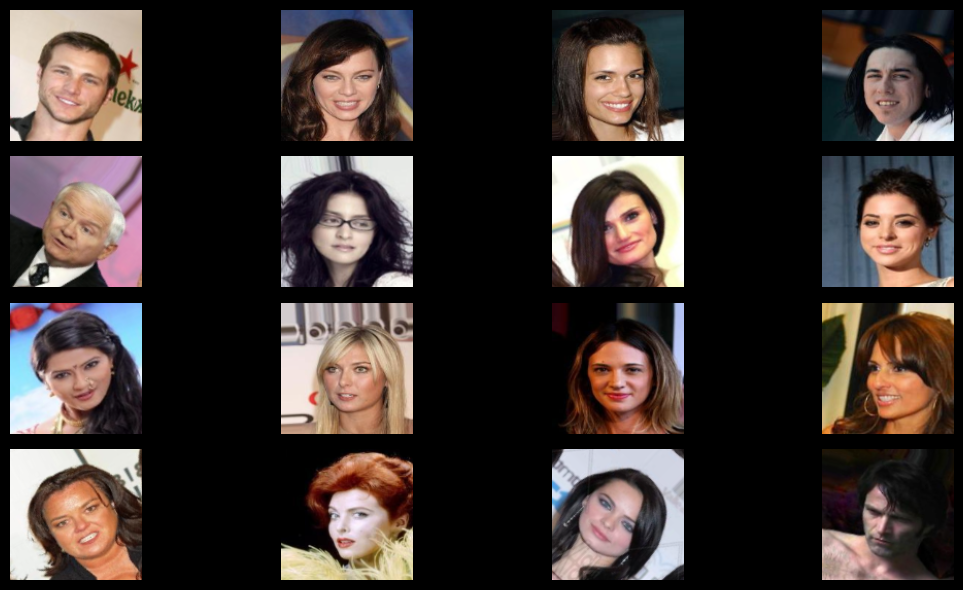

</details>

Complete the function below

In [ ]:
### START CODE HERE ###
def imshow_grid(images, title="Images", rows=2, cols=4, figsize=(12, 6)):
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten() if rows * cols > 1 else [axes]
    
    for i, img in enumerate(images[:rows*cols]):
        if torch.is_tensor(img):
            img = img.permute(1, 2, 0).cpu().numpy()
        img = np.clip(img, 0, 1)
        
        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f'Image {i+1}')
    
    for i in range(len(images), len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
### END CODE HERE ###

In [ ]:
### START CODE HERE ###
data_dir = 'data/img_align_celeba'
image_files = [f for f in os.listdir(data_dir) if f.endswith('.jpg')]
image_paths = [os.path.join(data_dir, f) for f in image_files]

dataset = CustomImageDataset(image_paths, 
                           gauss_noise=True, 
                           gauss_blur=True, 
                           resize=128, 
                           p=0.7)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

### END CODE HERE ###

Batch shape: torch.Size([8, 3, 128, 128])
Ground truth shape: torch.Size([8, 3, 128, 128])


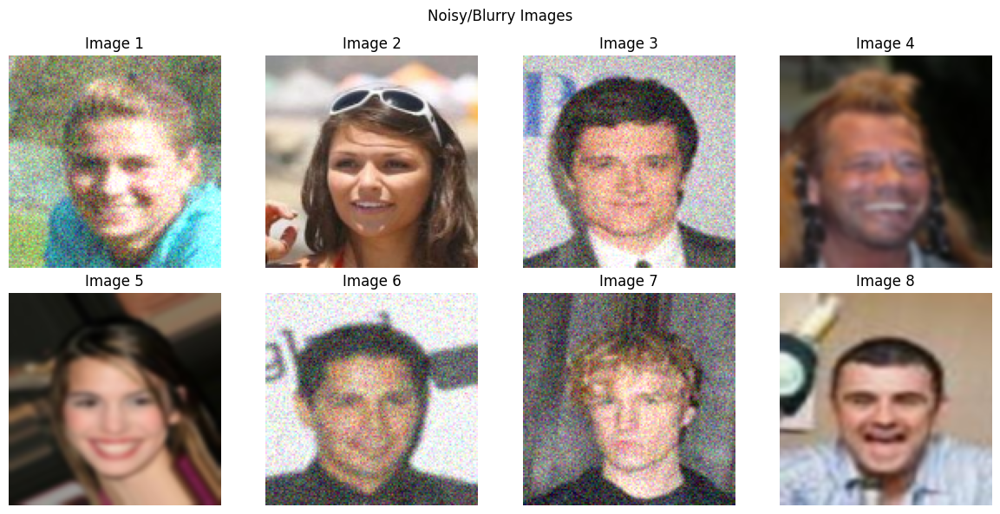

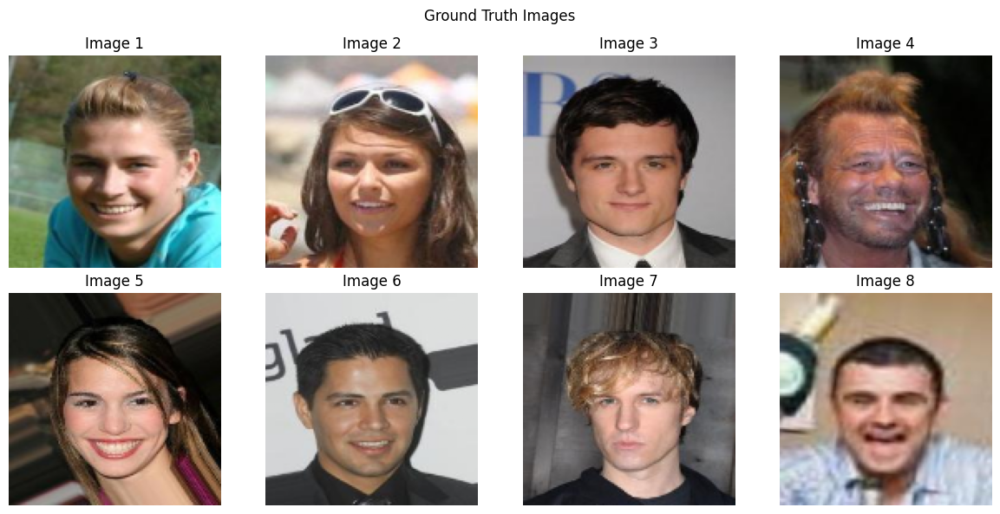

In [ ]:
### START CODE HERE ###
batch, gt_img = next(iter(dataloader))

print(f"Batch shape: {batch.shape}")
print(f"Ground truth shape: {gt_img.shape}")

imshow_grid(batch, "Noisy/Blurry Images", rows=2, cols=4)
imshow_grid(gt_img, "Ground Truth Images", rows=2, cols=4)

### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model based on the provided code below. However, please maintain the concept of 'Autoencoder'.
[Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)

In [ ]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x

class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv_in = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.down1 = DownSamplingBlock(16, 32, kernel_size=3, stride=1, padding=1)
        self.down2 = DownSamplingBlock(32, 64, kernel_size=3, stride=1, padding=1)
        self.down3 = DownSamplingBlock(64, 128, kernel_size=3, stride=1, padding=1)

        self.bottleneck = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1)

        self.up1 = UpSamplingBlock(128, 64, kernel_size=3, stride=1, padding=1)
        self.up2 = UpSamplingBlock(64, 32, kernel_size=3, stride=1, padding=1)
        self.up3 = UpSamplingBlock(32, 16, kernel_size=3, stride=1, padding=1)
        self.conv_out = nn.Conv2d(16, 3, kernel_size=3, stride=1, padding=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = F.relu(self.conv_in(x))
        x = self.down1(x)
        x = self.down2(x)
        x = self.down3(x)
        
        x = F.relu(self.bottleneck(x))
        
        x = self.up1(x)
        x = self.up2(x)
        x = self.up3(x)
        x = self.sigmoid(self.conv_out(x))
        
        return x
    
### END CODE HERE ###

If you define your model class correcly, the cell below should run without any errors.

In [72]:
model = Autoencoder()
print(model)
out = model(batch[0].unsqueeze(dim=0).float())

Autoencoder(
  (conv_in): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSamplingBlock(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down3): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (bottleneck): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (up1): UpSamplingBlock(
    (conv): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mod

early stopping

## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [ ]:
### START CODE HERE ###
def train(model, opt, loss_fn, train_loader, test_loader, epochs=10, checkpoint_path=None, device='cpu'):
    print("🤖Training on", device)
    print(f"Training batches: {len(train_loader)}, Test batches: {len(test_loader)}")
    model = model.to(device)
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        train_bar = tqdm(train_loader, desc=f'🚀Training Epoch [{epoch+1}/{epochs}]', unit='batch')
        
        batch_count = 0
        for images, gt in train_bar:
            images, gt = images.to(device, non_blocking=True), gt.to(device, non_blocking=True)
            
            opt.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, gt)
            loss.backward()
            opt.step()
            
            train_loss += loss.item()
            batch_count += 1
            
            train_bar.set_postfix(loss=f'{loss.item():.4f}', batch=f'{batch_count}/{len(train_loader)}')
            
            if batch_count >= 10:
                break
        
        avg_train_loss = train_loss / batch_count
        
        model.eval()
        test_loss = 0.0
        test_count = 0
        
        with torch.no_grad():
            for images, gt in tqdm(test_loader, desc='📄Testing', unit='batch'):
                images, gt = images.to(device, non_blocking=True), gt.to(device, non_blocking=True)
                outputs = model(images)
                loss = loss_fn(outputs, gt)
                test_loss += loss.item()
                test_count += 1
                
                if test_count >= 5:
                    break
        
        avg_test_loss = test_loss / test_count
        print(f"Epoch {epoch+1} - Train Loss: {avg_train_loss:.4f}, Test Loss: {avg_test_loss:.4f}")
        
        if checkpoint_path and epoch == epochs - 1:
            torch.save(model.state_dict(), checkpoint_path)
            print(f"Model saved to {checkpoint_path}")
        
### END CODE HERE ###

Let's train your model.

In [ ]:
### START CODE HERE ###
data_dir = 'data/img_align_celeba'
files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files if file.endswith('.jpg')]

files = files[:200]
print(f"Using {len(files)} images for training")

train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)

train_dataset = CustomImageDataset(train_files, gauss_noise=True, gauss_blur=True, resize=64, p=0.7)
test_dataset = CustomImageDataset(test_files, gauss_noise=True, gauss_blur=True, resize=64, p=0.7)
trainloader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0)
testloader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=0)

### END CODE HERE ###

Using 200 images for training


In [ ]:
### START CODE HERE ###
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

train(model, opt, loss_fn, trainloader, testloader, epochs=20, 
      checkpoint_path='autoencoder_model.pth', device=device)

### END CODE HERE ###

Using device: cpu
🤖Training on cpu
Training batches: 5, Test batches: 2


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 10.34batch/s]


Epoch 1 - Train Loss: 0.0906, Test Loss: 0.0914


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 20.21batch/s]


Epoch 2 - Train Loss: 0.0865, Test Loss: 0.0888


📄Testing: 100%|██████████| 2/2 [00:00<00:00,  9.21batch/s]


Epoch 3 - Train Loss: 0.0826, Test Loss: 0.0777


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 16.81batch/s]


Epoch 4 - Train Loss: 0.0738, Test Loss: 0.0667


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 12.99batch/s]


Epoch 5 - Train Loss: 0.0713, Test Loss: 0.0687


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 16.24batch/s]


Epoch 6 - Train Loss: 0.0683, Test Loss: 0.0703


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 20.79batch/s]


Epoch 7 - Train Loss: 0.0640, Test Loss: 0.0601


📄Testing: 100%|██████████| 2/2 [00:00<00:00,  9.07batch/s]


Epoch 8 - Train Loss: 0.0566, Test Loss: 0.0464


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 14.24batch/s]


Epoch 9 - Train Loss: 0.0463, Test Loss: 0.0501


📄Testing: 100%|██████████| 2/2 [00:00<00:00,  5.76batch/s]


Epoch 10 - Train Loss: 0.0449, Test Loss: 0.0417


📄Testing: 100%|██████████| 2/2 [00:00<00:00,  9.97batch/s]


Epoch 11 - Train Loss: 0.0411, Test Loss: 0.0391


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 20.02batch/s]


Epoch 12 - Train Loss: 0.0398, Test Loss: 0.0374


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 15.38batch/s]


Epoch 13 - Train Loss: 0.0369, Test Loss: 0.0371


📄Testing: 100%|██████████| 2/2 [00:00<00:00,  8.45batch/s]


Epoch 14 - Train Loss: 0.0362, Test Loss: 0.0341


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 18.27batch/s]


Epoch 15 - Train Loss: 0.0367, Test Loss: 0.0363


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 16.89batch/s]


Epoch 16 - Train Loss: 0.0379, Test Loss: 0.0384


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 18.57batch/s]


Epoch 17 - Train Loss: 0.0378, Test Loss: 0.0344


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 11.43batch/s]


Epoch 18 - Train Loss: 0.0372, Test Loss: 0.0438


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 20.95batch/s]


Epoch 19 - Train Loss: 0.0350, Test Loss: 0.0370


📄Testing: 100%|██████████| 2/2 [00:00<00:00, 16.75batch/s]

Epoch 20 - Train Loss: 0.0360, Test Loss: 0.0341
Model saved to autoencoder_model.pth


Let's use your trained model.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Input images<br>
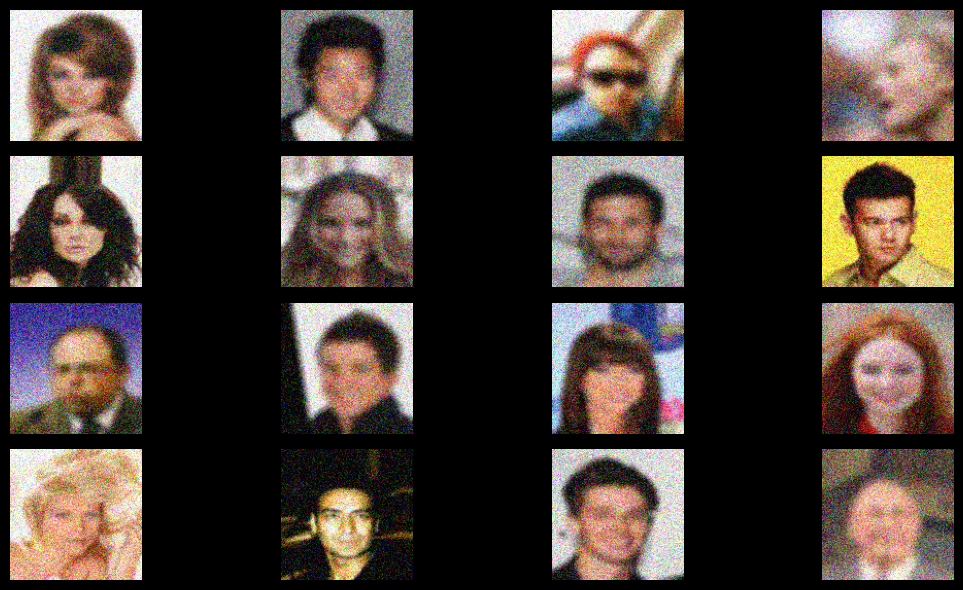

- Output images<br>
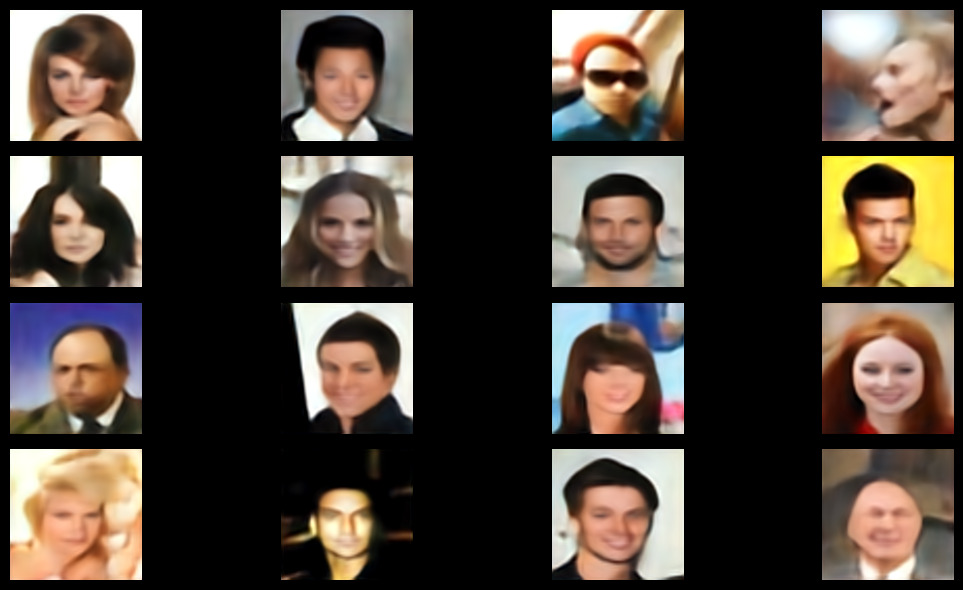

- Ground Truth images<br>
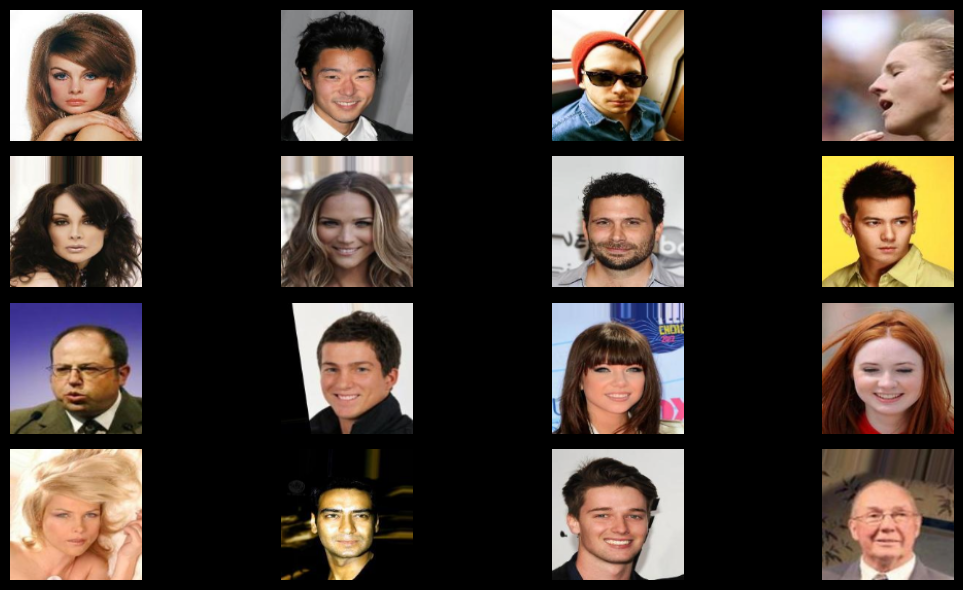

</details>

Input Images (Noisy/Blurry):


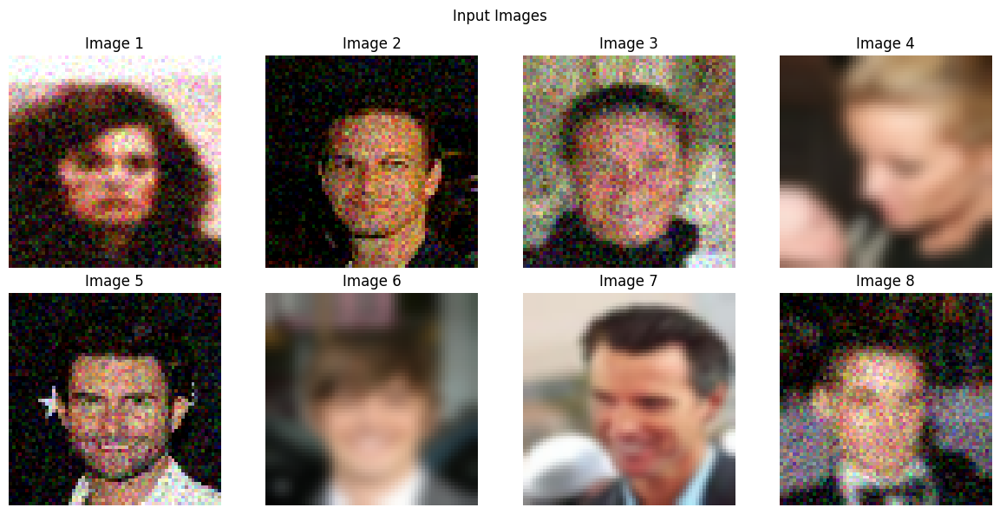

Output Images (Denoised/Deblurred):


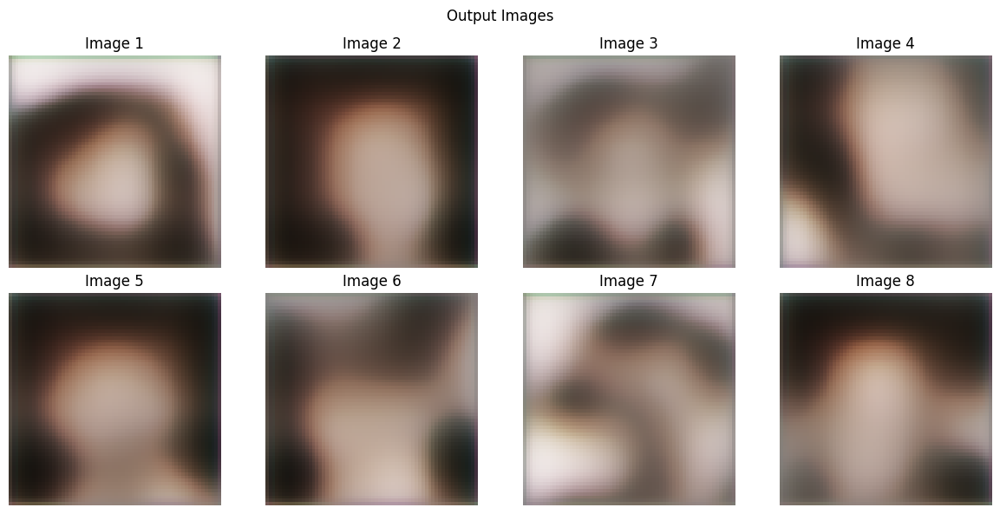

Ground Truth Images:


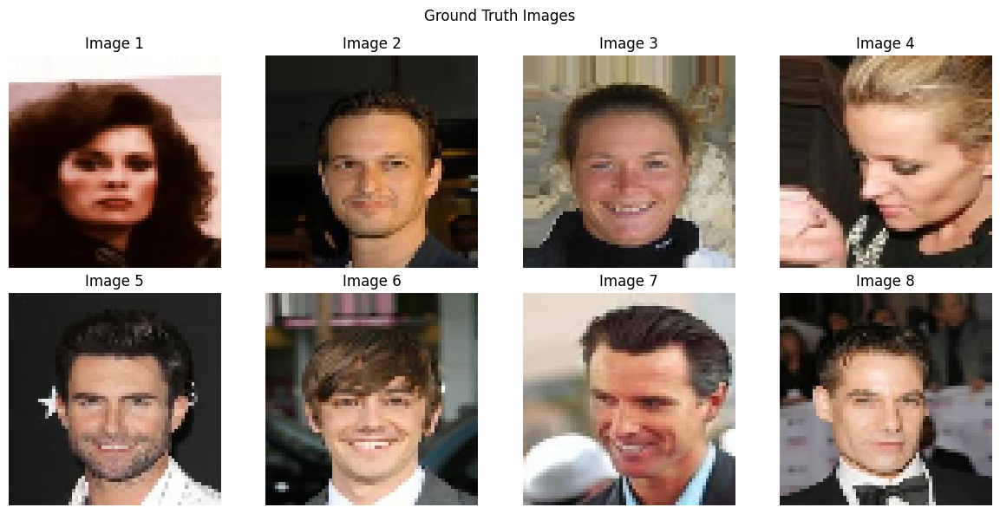

In [ ]:
### START CODE HERE ###
# Load a test batch
model.eval()
test_batch, test_gt = next(iter(testloader))

with torch.no_grad():
    test_batch = test_batch.to(device)
    outputs = model(test_batch)
    outputs = outputs.cpu()

print("Input Images (Noisy/Blurry):")
imshow_grid(test_batch.cpu()[:8], "Input Images", rows=2, cols=4)

print("Output Images (Denoised/Deblurred):")
imshow_grid(outputs[:8], "Output Images", rows=2, cols=4)

print("Ground Truth Images:")
imshow_grid(test_gt[:8], "Ground Truth Images", rows=2, cols=4)

### END CODE HERE ###

## Explore feature map
Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers or block of your model. Then, save it as an image.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

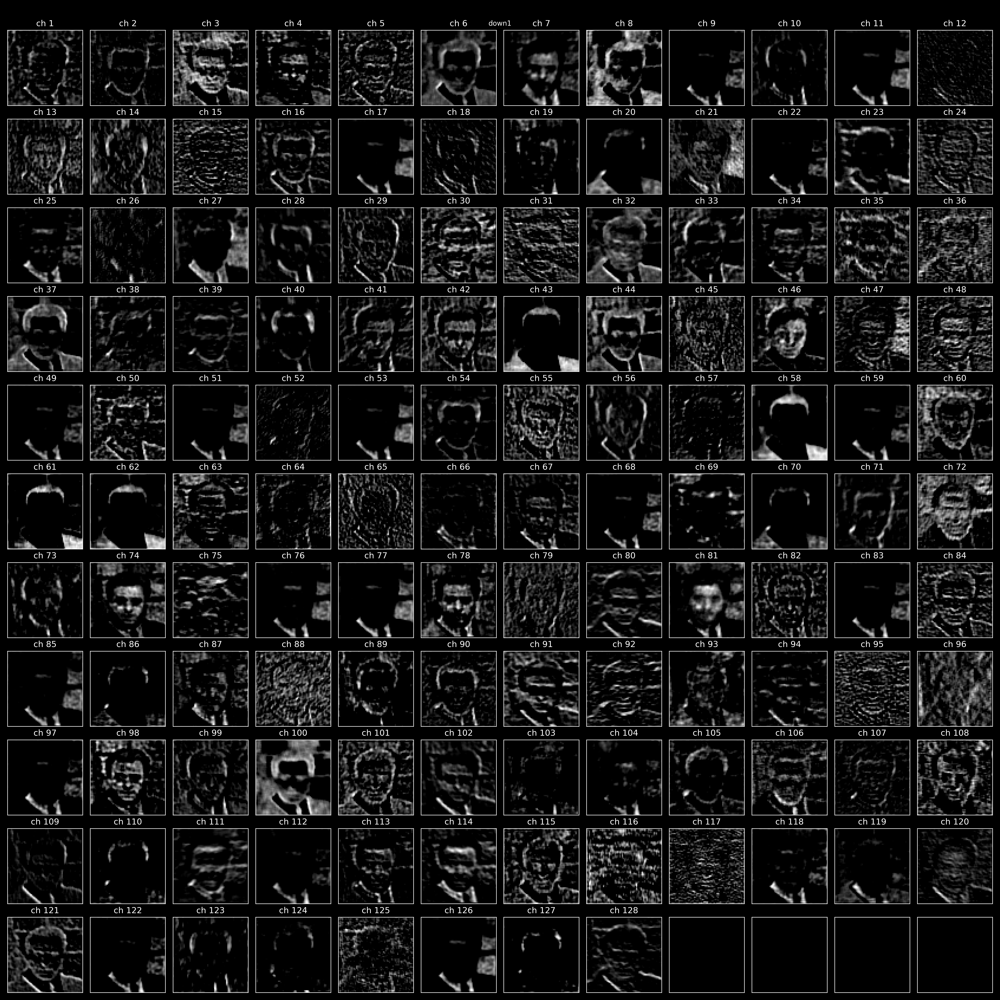
</details>

In [45]:
class FeatureExtractor(nn.Module):
    def __init__(self, model, target_layers):
        super(FeatureExtractor, self).__init__()
        self.model = copy.deepcopy(model)
        self.target_layers = target_layers
        self.features = []

        for layer_name, layer in self.model.named_modules():
            if layer_name in target_layers:
                layer.register_forward_hook(self.save_feature(layer_name))

    def save_feature(self, layer_name):
        def hook(module, input, output):
            self.features.append(output)
        return hook

    def forward(self, x):
        self.features = []
        self.model(x)
        return self.features

In [ ]:
### START CODE HERE ###
def visualize_feature_map(x, base_filename):
    if torch.is_tensor(x):
        x = x.detach().cpu().numpy()

    if x.ndim == 4:
        x = x.squeeze(0)
    
    num_channels = x.shape[0]
    cols = 8
    rows = (num_channels + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 2))
    axes = axes.flatten() if rows * cols > 1 else [axes]
    
    for i in range(num_channels):
        feature_map = x[i]
        axes[i].imshow(feature_map, cmap='viridis')
        axes[i].set_title(f'Channel {i}')
        axes[i].axis('off')
    
    for i in range(num_channels, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.savefig(f'{base_filename}.png', dpi=150, bbox_inches='tight')
    plt.show()
### END CODE HERE ###

Visualizing conv_in - Shape: torch.Size([1, 16, 64, 64])


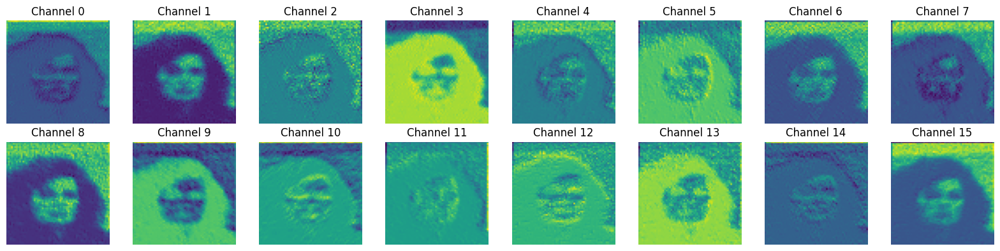

Visualizing down1 - Shape: torch.Size([1, 32, 32, 32])


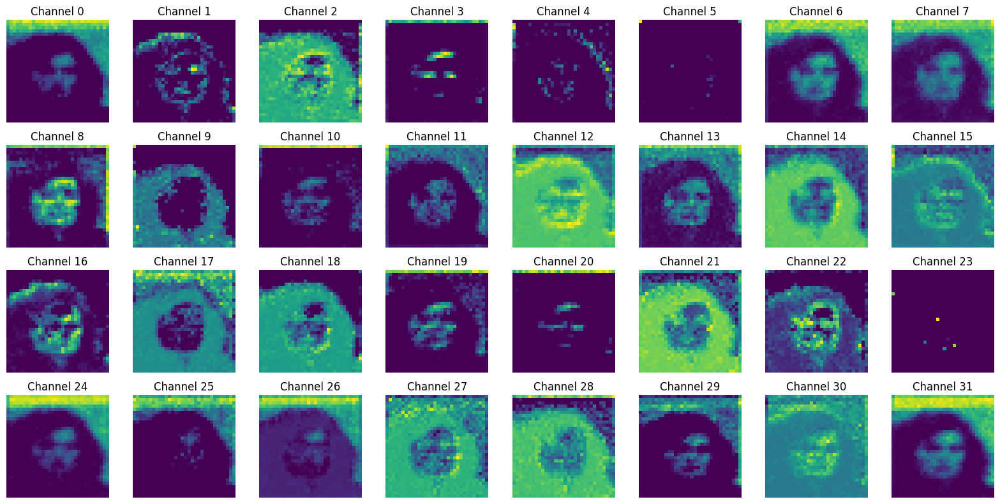

Visualizing down2 - Shape: torch.Size([1, 64, 16, 16])


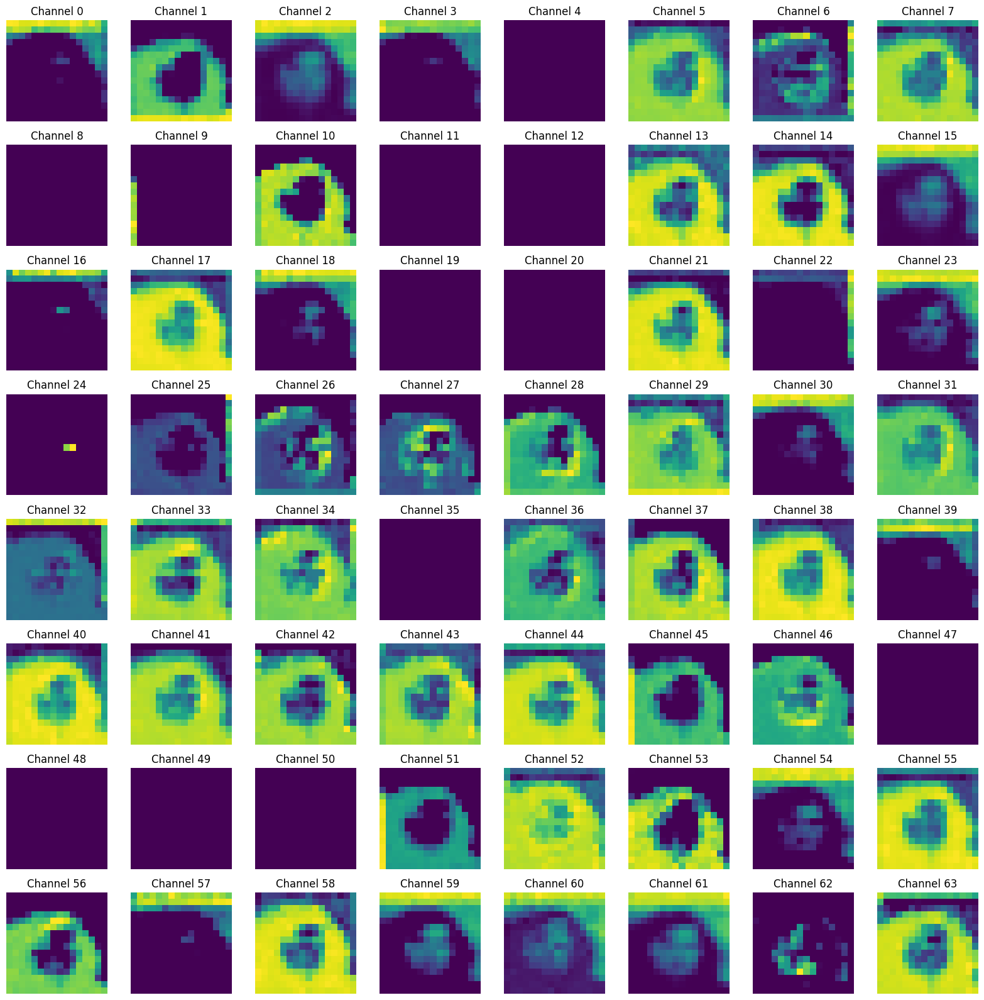

Visualizing down3 - Shape: torch.Size([1, 128, 8, 8])


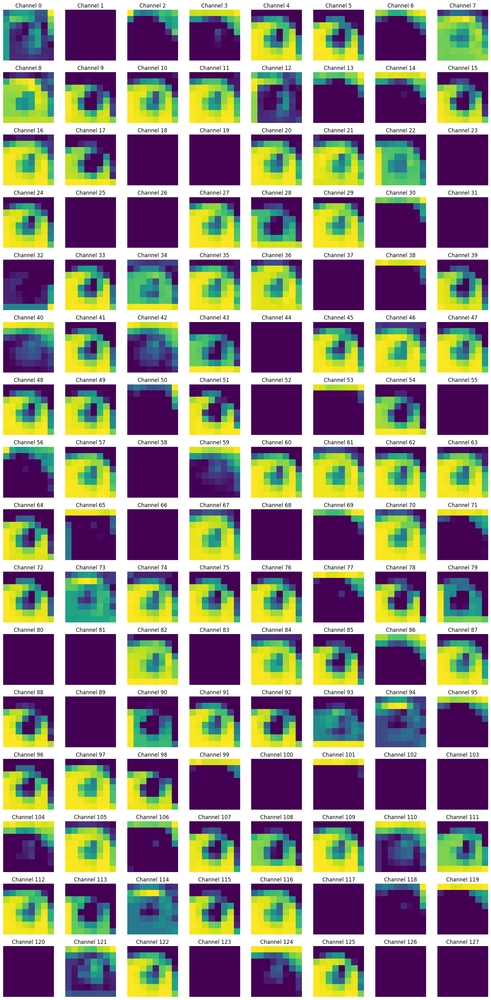

Visualizing bottleneck - Shape: torch.Size([1, 128, 8, 8])


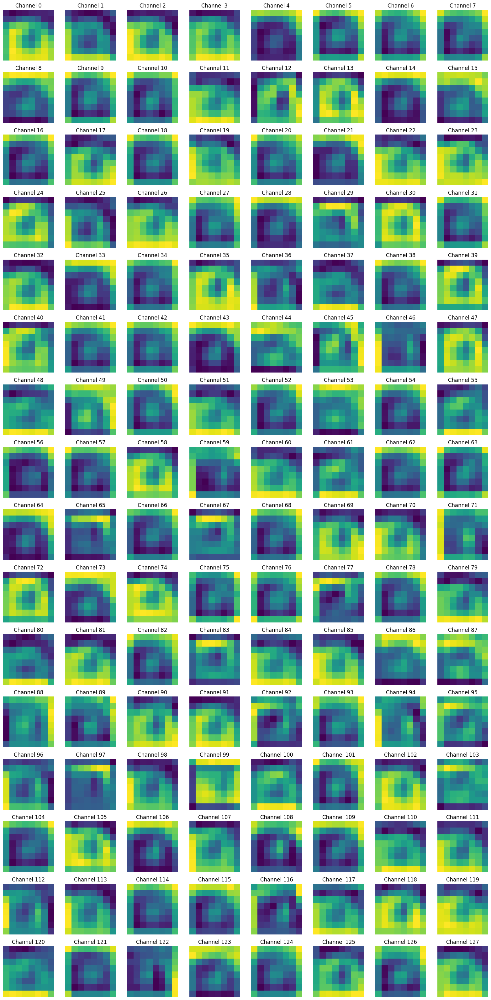

Visualizing up1 - Shape: torch.Size([1, 64, 16, 16])


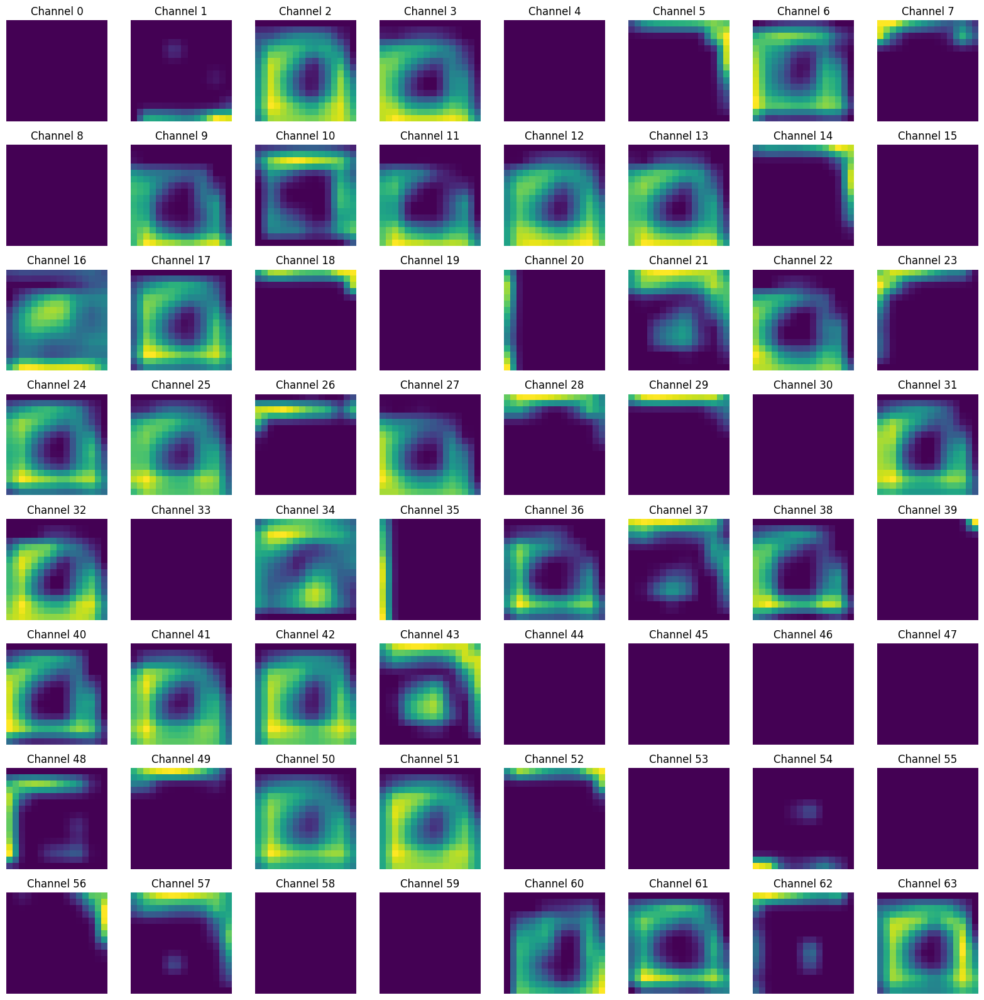

Visualizing up2 - Shape: torch.Size([1, 32, 32, 32])


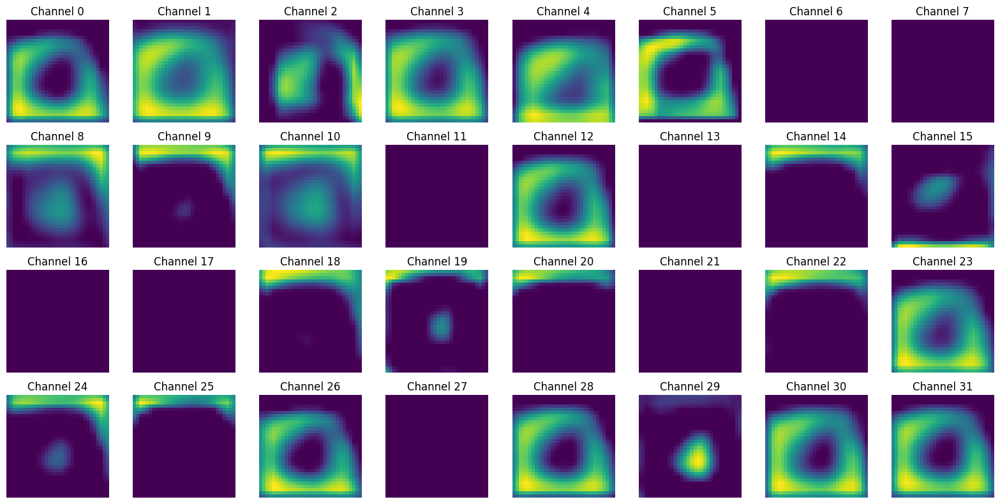

Visualizing up3 - Shape: torch.Size([1, 16, 64, 64])


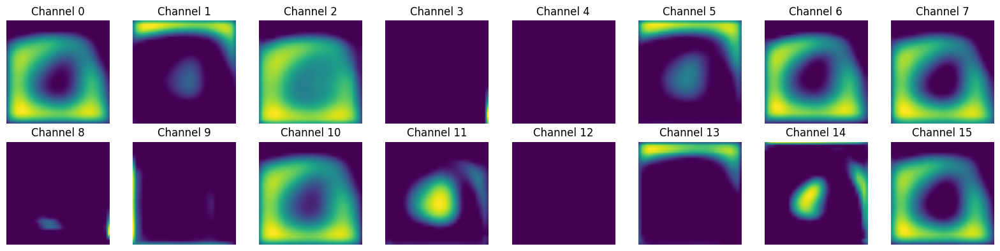

Visualizing conv_out - Shape: torch.Size([1, 3, 64, 64])


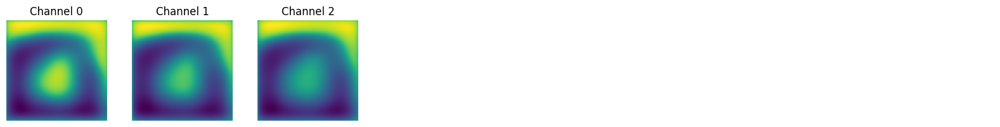

In [ ]:
### START CODE HERE ###
target_layers = ['conv_in', 'down1', 'down2', 'down3', 'bottleneck', 'up1', 'up2', 'up3', 'conv_out']

feature_extractor = FeatureExtractor(model, target_layers)
sample_input = test_batch[0:1].to(device)  # Take one image from batch
features = feature_extractor(sample_input)

layer_names = ['conv_in', 'down1', 'down2', 'down3', 'bottleneck', 'up1', 'up2', 'up3', 'conv_out']

for i, (feature, layer_name) in enumerate(zip(features, layer_names)):
    print(f"Visualizing {layer_name} - Shape: {feature.shape}")
    visualize_feature_map(feature, f'feature_map_{layer_name}')
### END CODE HERE ###

---

# Inference on Test Images
Process test images using your trained autoencoder model.

In [ ]:
# Simple inference on test images (Lab5_2 style)
import os
from PIL import Image  # ensure PIL is available for saving
from tqdm import tqdm

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Try to load trained weights if available
ckpt_path = 'autoencoder_model.pth'
if os.path.exists(ckpt_path):
    print(f"Loading weights from '{ckpt_path}'")
    infer_model = Autoencoder().to(device)
    state = torch.load(ckpt_path, map_location='cpu')
    # Support both raw state_dict and dict with 'state_dict'
    if isinstance(state, dict) and 'state_dict' in state:
        state = state['state_dict']
    infer_model.load_state_dict(state, strict=True)
else:
    print("Checkpoint not found; using current in-memory model if available.")
    infer_model = model.to(device) if 'model' in globals() else Autoencoder().to(device)

DATA_PATH = './data/test'

# Check if test directory exists
if os.path.exists(DATA_PATH):
    jpgs = [f for f in os.listdir(DATA_PATH) if f.lower().endswith('.jpg')]
    print(f"Found test directory with {len(jpgs)} images")

    # Load test images
    test_files = jpgs
    test_paths = [os.path.join(DATA_PATH, f) for f in test_files]
    
    # Create dataset for inference (no noise/blur)
    test_inference_dataset = CustomImageDataset(test_paths, gauss_noise=False, gauss_blur=False, resize=128, p=0.0)
    test_inference_loader = DataLoader(test_inference_dataset, batch_size=8, shuffle=False, num_workers=0)
    
    # Create output directory
    output_dir = 'data/denoised_results'
    os.makedirs(output_dir, exist_ok=True)
    
    # Process images
    infer_model.eval()
    processed = 0
    
    print(f"Processing {len(test_files)} test images...")
    
    with torch.no_grad():
        for batch_idx, (images, _) in enumerate(tqdm(test_inference_loader, desc="Processing")):
            images = images.to(device)
            outputs = infer_model(images).cpu()
            
            # Save each image
            for i in range(outputs.shape[0]):
                if processed >= len(test_files):
                    break
                    
                # Convert to PIL and save
                output_img = outputs[i]
                output_img = torch.clamp(output_img, 0, 1)
                output_np = output_img.permute(1, 2, 0).numpy()
                output_pil = Image.fromarray((output_np * 255).astype('uint8'))
                
                filename = test_files[processed]
                output_path = os.path.join(output_dir, filename)
                output_pil.save(output_path)
                processed += 1
    
    print(f"✅ Processed {processed} images and saved to '{output_dir}'")
    
else:
    print(f"Test directory '{DATA_PATH}' not found. Skipping inference.")

## **Question**
1. Explain how changing the number of layers and the number of nodes in a Convolutional Neural Network (CNN) affects its performance (model accuracy, training time, and generalization/overfitting?  
2. Explain a comparison of PSNR and SSIM values (objective measurment) to your eye perception (subjective measurement) and suggest the criteria for High, Medium, Low image quality.
3. Explain a comparison of the autoencoder results between training without/with augmentation by visualizing feature maps at each layer.
4. Ranking the autoencoder performance in terms of PSNR and SSIM for each augmentation technique. Which augmentation techiques are mostly affect the autoencoder performance and must introduce to the training?
5. If a flatten layer is added after the last downsampling block to create the latent code (1D) and a dense layer ((linear + activation node)+ reshape back to the feature map size of input of the first upsampling block ) is added at the first layer of decoder before the first upsampling block. Explain a comparison of autoencoder results between 2D vs 1D latent and how feature map of each decoder block changes?
6. Explain the effect of reduced latent code from 2D to 1D.

## **Answer**
<br>**1.** 
- ขยายความสามารถ: เพิ่ม `layer/channels` เพิ่มความจุของ model ทำให้จับรูปแบบที่ซับซ้อนขึ้น → โอกาสเพิ่มความแม่นยำถ้ามีข้อมูลพอและออกแบบดี
- เวลาในการฝึก: `parameters` มากขึ้น = คำนวณมากขึ้น = เวลา/หน่วยความจำเพิ่มขึ้น (ฝึกช้าลง)
- `overfitting`: `parameters` มากขึ้นเสี่ยง `overfitting` หากข้อมูลไม่พอ -> ต้องใช้ `regularization` `(weight decay, dropout)`, `augmentation`, `early stopping`
- ปัจจัยเชิงปฏิบัติ: ความลึกช่วยขยาย receptive field แต่ต้องระวัง vanishing/exploding gradient (แก้ด้วย BN, residual)
- สรุปเชิงปฏิบัติ: เพิ่มได้แต่ต้องสมดุลกับข้อมูล/regularization และงบประมาณการคำนวณ

<br>**2.** <br>
PSNR/SSIM เทียบกับการมองเห็น และเกณฑ์คุณภาพ
- PSNR: function จาก MSE — วัดความคลาดเคลื่อน pixel โดยรวม เหมาะวัดความต่างเชิง pixel แต่ไม่ตอบโจทย์โครงสร้างภาพและการรับรู้ของมนุษย์
- SSIM: วัดความคล้ายเชิงโครงสร้าง (luminance, contrast, structure) ใกล้เคียงการรับรู้ภาพมากกว่า PSNR
- ความไม่ตรงกันกับสายตา: ภาพที่ PSNR สูงอาจดูแปลก (รายละเอียดโครงสร้างหาย) แต่ SSIM สูงมักสอดคล้องกับความรู้สึกว่า “เหมือนของจริง” มากกว่า

ตัวอย่างเกณฑ์ (ค่าประมาณ ใช้เป็นแนวทาง):
- สูง: PSNR > ~30 dB และ SSIM > ~0.90 — โดยสายตามักพอรับได้
- กลาง: PSNR 20–30 dB และ SSIM 0.70–0.90 — บางรายละเอียดหาย เห็น noise/เบลอ
- ต่ำ: PSNR < ~20 dB และ SSIM < ~0.70 — คุณภาพแย่ชัดเจน

<br>**3.** <br>
ผลต่างของการฝึกมี/ไม่มี augmentation บน feature maps
- layer ต้น: base feature (ขอบ, มุม) ยังคงแสดงทั้ง 2 กรณี แต่ในโมเดลที่ฝึกด้วย augmentation จะมีความทนทานต่อ noise น้อยลง
- layer ลึก: model ที่ไม่มี augmentation มักแสดง activation เฉพาะรูปแบบที่ปรากฏใน train ชุดนั้น (อาจ overfit เป็น pattern ของ noise) ขณะที่มี augmentation จะเห็น activation กระจายและจับโครงสร้างจริงมากกว่า
 
<br>**4.** 
1. Gaussian / additive noise (สำคัญสุดสำหรับ denoising)
2. Blur (Gaussian/motion blur) (สำคัญสำหรับ deblurring)
3. Compression artifacts / JPEG noise (มีผลต่อ perceptual quality)
4. Mild geometric transforms (rotation/flip/scale) — ช่วย generalization แต่ผลต่อ PSNR/SSIM น้อยกว่า noise/blur
5. Color jitter — น้อยกว่าถ้างานเน้นโครงสร้างและค่าสีไม่สำคัญ

<br>**5.** <br>
Latent 2D (feature map 2D):
- เก็บข้อมูลเชิงตำแหน่ง (spatial) และช่อง (channels) → decoder สามารถใช้ conv-upsampling ที่รักษา locality ได้โดยตรง
- ผลลัพธ์มักคมชัดกว่า รายละเอียดเชิงโครงสร้างดีกว่า และเรียนได้เร็วกว่าเมื่อใช้ conv-based decoder

Latent 1D (flatten + dense → reshape):
- ข้อมูล spatial ถูกบีบรวมเป็น vector → ต้องให้ dense layer "เรียนรู้" การสร้าง spatial arrangement ใหม่เมื่อ reshape กลับ
- มักต้อง dense ขนาดใหญ่เพื่อให้คืนรายละเอียด ทำให้พารามิเตอร์เพิ่มหรือคุณภาพลดลงถ้าขนาด latent เล็ก
- feature maps ใน decoder เริ่มจากการ reshape ที่อาจมีลักษณะเป็นสัญญาณกระจาย (noisy) ต้องใช้ conv หลายชั้นเพื่อเรียงฟีเจอร์เป็นโครงสร้างภาพ

<br>**6.** 
- การบีบข้อมูลมากขึ้น -> สูญเสียรายละเอียดเล็ก ๆ (lossy reconstruction) → PSNR/SSIM ลดลง ภาพดูนุ่ม/เบลอขึ้น
- อาจช่วย generalization ในกรณีที่ model ถูก overfit (บังคับให้เรียน representation ที่กะทัดรัด)
- มี trade-off ระหว่าง compression (ขนาดเล็ก) กับคุณภาพ (reconstruction fidelity) — เป็นปัญหา rate–distortion

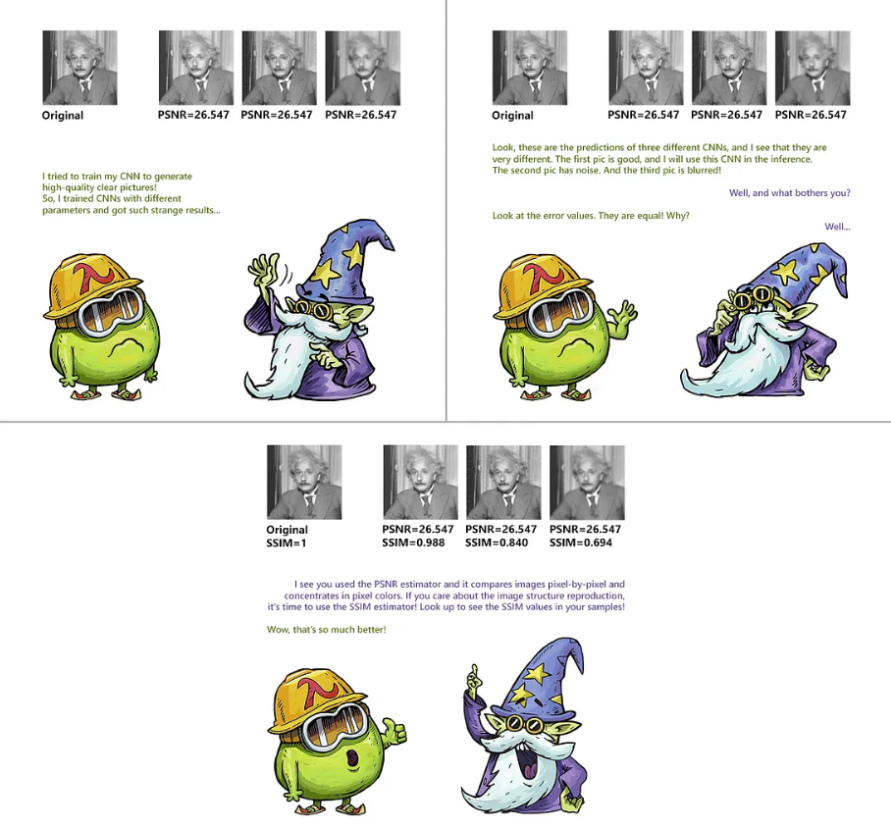